In [1]:
# Import required libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage, signal
from skimage import filters, segmentation, morphology
from skimage.filters.rank import entropy
from skimage.morphology import disk
import warnings
warnings.filterwarnings('ignore')

# Set up matplotlib for better visualization
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['image.cmap'] = 'gray'

Image loaded successfully!
Image shape: (481, 321)


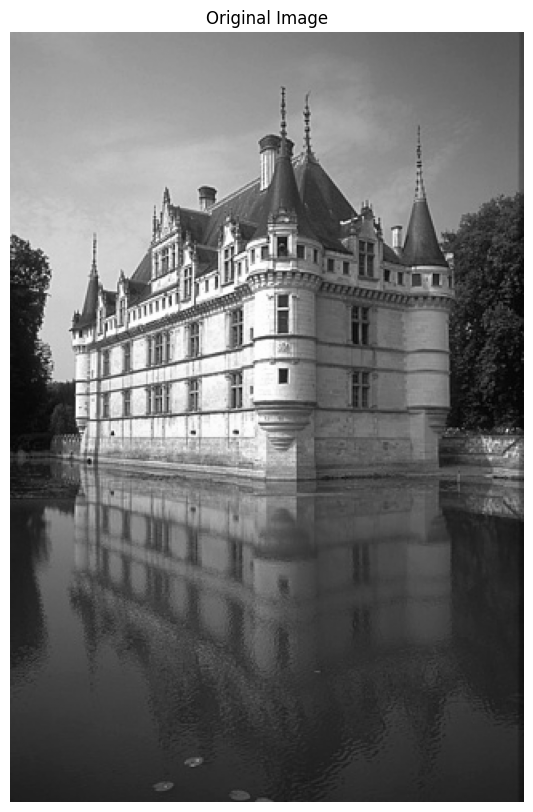

In [2]:
def display_images(images, titles, rows=2, cols=3, figsize=(15, 10)):
    """
    Display multiple images in a grid
    """
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = axes.flatten()

    for idx, (img, title) in enumerate(zip(images, titles)):
        if idx < len(axes):
            if len(img.shape) == 3:
                axes[idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            else:
                axes[idx].imshow(img, cmap='gray')
            axes[idx].set_title(title)
            axes[idx].axis('off')

    # Hide unused subplots
    for idx in range(len(images), len(axes)):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()


# Load image
image_path = 'assets/segmentation/0010.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if image is None:
    print(f"Error: Could not load image from {image_path}")
    print("Please check if the file exists.")
else:
    print(f"Image loaded successfully!")
    print(f"Image shape: {image.shape}")
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')
    plt.show()

## 1. Prewitt Operator

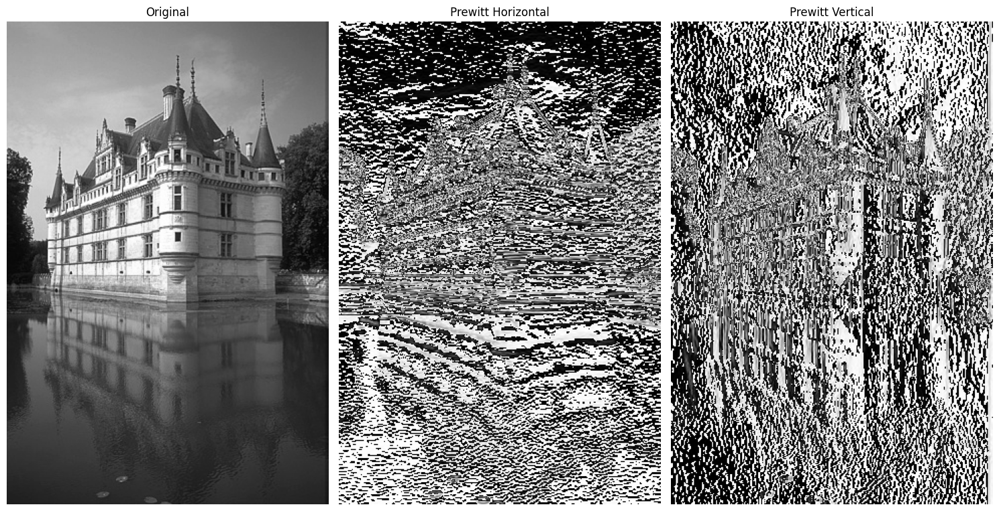

In [3]:
def prewitt_edge_detection(image):
    """
    Apply Prewitt operator for edge detection
    """
    # Using SciPy
    prewitt_h = ndimage.prewitt(image, axis=0)  # Horizontal edges
    prewitt_v = ndimage.prewitt(image, axis=1)  # Vertical edges

    return prewitt_h, prewitt_v

# Apply Prewitt operator
prewitt_h, prewitt_v = prewitt_edge_detection(image)

display_images(
    [image, prewitt_h, prewitt_v],
    ['Original', 'Prewitt Horizontal', 'Prewitt Vertical'],
    rows=1, cols=3
)

## 2. Sobel Operator

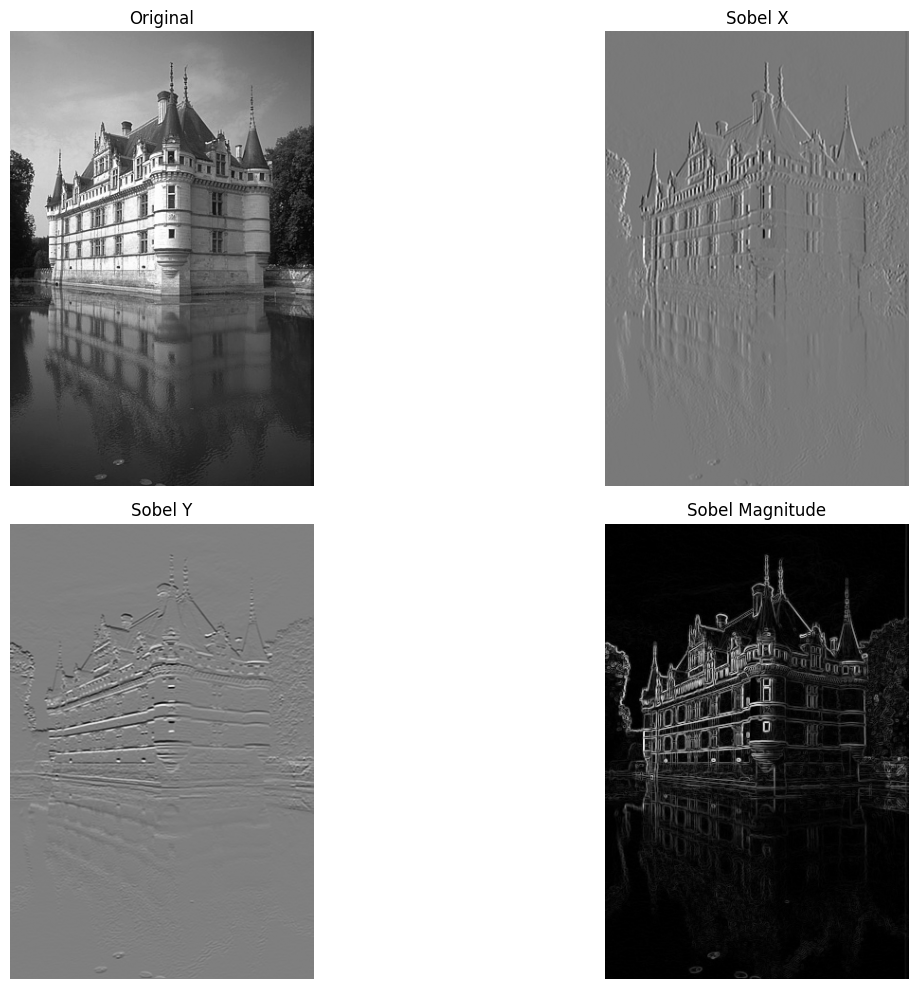

In [4]:
def sobel_edge_detection(image):
    """
    Apply Sobel operator for edge detection
    """
    # Compute Sobel derivatives
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)  # X gradient
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)  # Y gradient

    # Compute gradient magnitude
    sobel_combined = np.sqrt(sobelx**2 + sobely**2)
    sobel_combined = np.uint8(sobel_combined * 255.0 / sobel_combined.max())

    return sobel_combined, sobelx, sobely

# Apply Sobel operator
sobel_mag, sobel_x, sobel_y = sobel_edge_detection(image)

display_images(
    [image, sobel_x, sobel_y, sobel_mag],
    ['Original', 'Sobel X', 'Sobel Y', 'Sobel Magnitude'],
    rows=2, cols=2
)

## 2.1. Morphological Enhancement for Sobel Edges

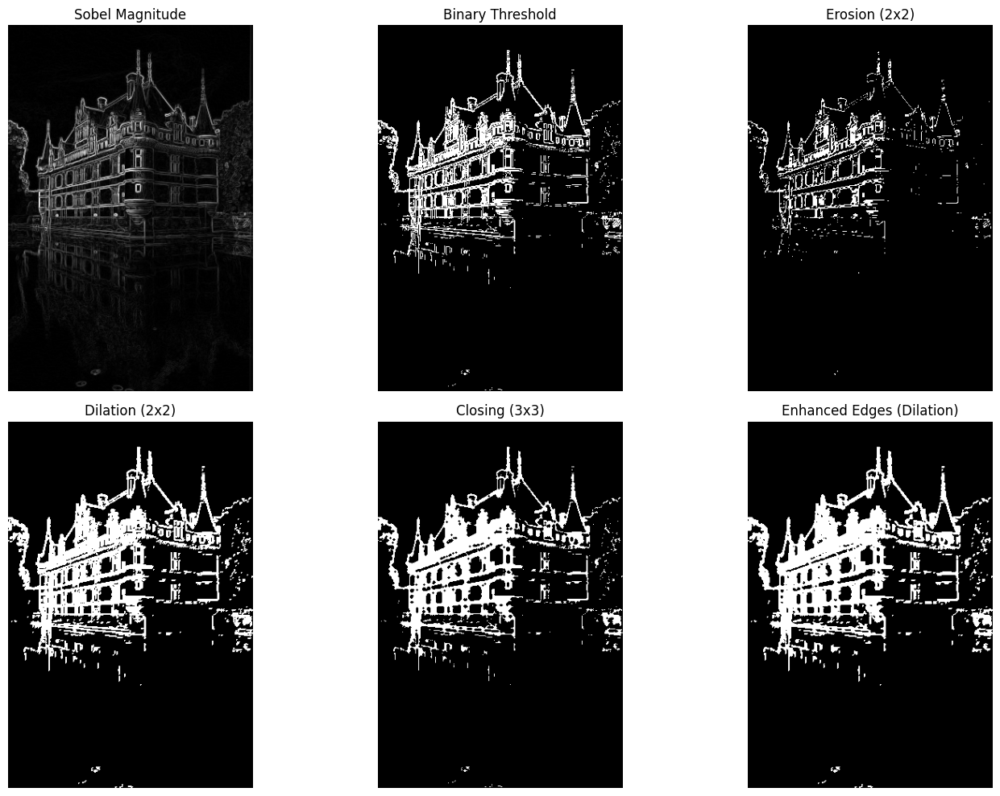

In [5]:
# Apply thresholding to Sobel magnitude to get binary edge map
_, sobel_binary = cv2.threshold(sobel_mag, 50, 255, cv2.THRESH_BINARY)

# Apply morphological operations to clean up edges
sobel_erosion = cv2.erode(sobel_binary, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2)), iterations=1)
sobel_dilation = cv2.dilate(sobel_binary, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2)), iterations=1)
sobel_closing = cv2.morphologyEx(sobel_binary, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)))

# Connect edge segments better
sobel_enhanced = cv2.morphologyEx(sobel_closing, cv2.MORPH_DILATE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2)))

display_images(
    [sobel_mag, sobel_binary, sobel_erosion, sobel_dilation, sobel_closing, sobel_enhanced],
    ['Sobel Magnitude', 'Binary Threshold', 'Erosion (2x2)', 'Dilation (2x2)', 'Closing (3x3)', 'Enhanced Edges (Dilation)'],
    rows=2, cols=3
)

## 3. Truncated Pyramid Operator

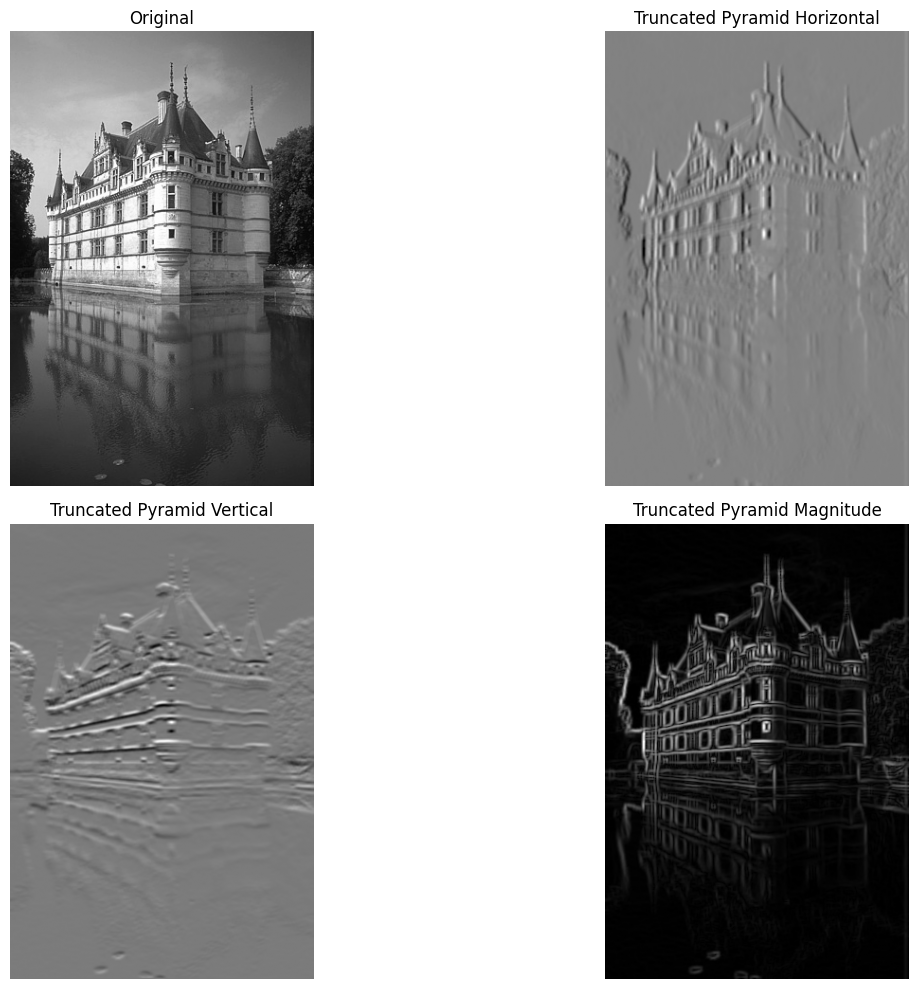

Truncated Pyramid Operator applied successfully!
Kernel size: 7x7, normalized by 1/34


In [6]:
def truncated_pyramid_operator(image):
    """
    Apply Truncated Pyramid Operator for edge detection
    Linearly decreasing weighting to pixels away from the center of the edge
    """
    kernel = np.array([
        [1,  1,  1,  0, -1, -1, -1],
        [1,  2,  2,  0, -2, -2, -1],
        [1,  2,  3,  0, -3, -2, -1],
        [1,  2,  3,  0, -3, -2, -1],
        [1,  2,  3,  0, -3, -2, -1],
        [1,  2,  2,  0, -2, -2, -1],
        [1,  1,  1,  0, -1, -1, -1]
    ], dtype=np.float32) / 34.0

    # Apply horizontal edge detection
    truncated_h = cv2.filter2D(image, cv2.CV_64F, kernel)

    # Apply vertical edge detection (transpose of kernel)
    truncated_v = cv2.filter2D(image, cv2.CV_64F, kernel.T)

    # Compute gradient magnitude
    magnitude = np.sqrt(truncated_h**2 + truncated_v**2)
    magnitude = (magnitude * 255.0 / magnitude.max()).astype(np.uint8)

    return magnitude, truncated_h, truncated_v


# Apply Truncated Pyramid operator
truncated_mag, truncated_h, truncated_v = truncated_pyramid_operator(image)

display_images(
    [image, truncated_h, truncated_v, truncated_mag],
    ['Original', 'Truncated Pyramid Horizontal',
        'Truncated Pyramid Vertical', 'Truncated Pyramid Magnitude'],
    rows=2, cols=2
)

print("Truncated Pyramid Operator applied successfully!")
print("Kernel size: 7x7, normalized by 1/34")

## 4. Laplacian Operator

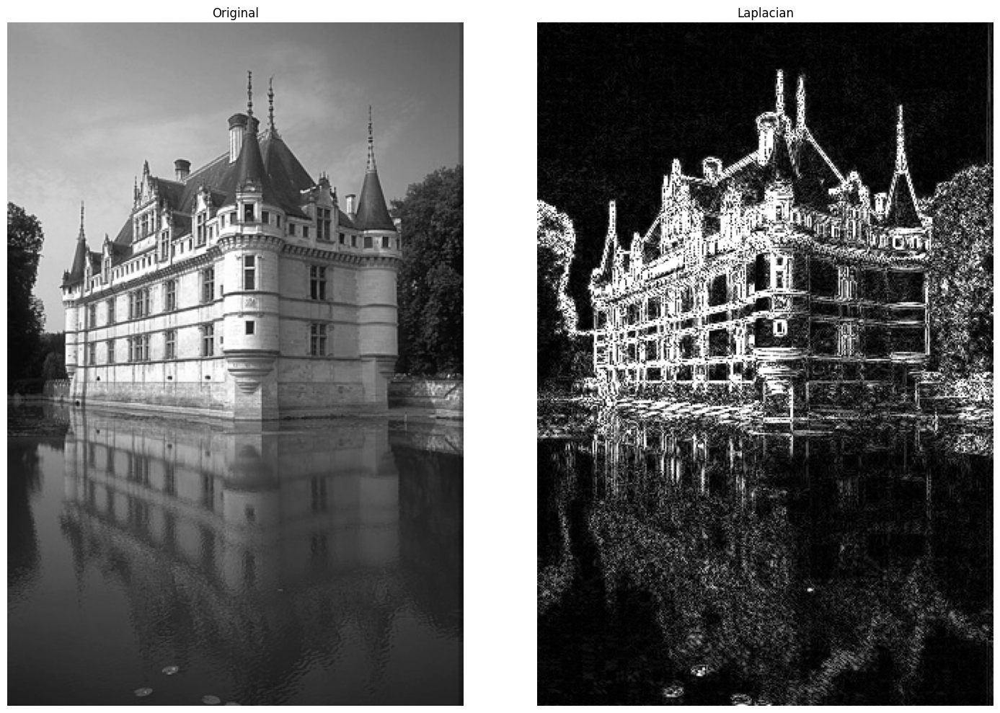

In [7]:
def laplacian_edge_detection(image):
    """
    Apply Laplacian operator for edge detection
    """
    # Apply Laplacian operator
    laplacian = cv2.Laplacian(image, cv2.CV_64F, ksize=3)
    laplacian_abs = cv2.convertScaleAbs(laplacian)
    
    return laplacian, laplacian_abs

# Apply Laplacian
laplacian, laplacian_abs = laplacian_edge_detection(image)

display_images(
    [image, laplacian_abs],
    ['Original', 'Laplacian'],
    rows=1, cols=2
)

## 5. Laplacian of Gaussian (LoG)

Combines Gaussian smoothing with Laplacian to reduce noise sensitivity.

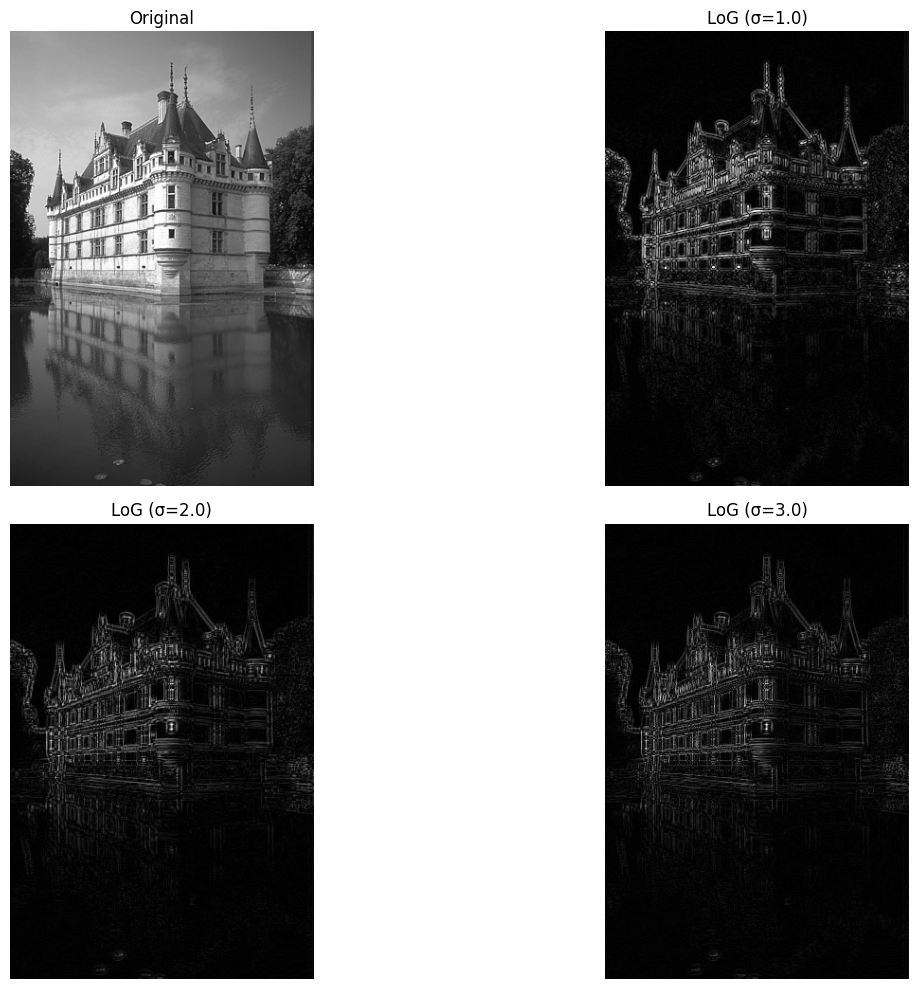

In [8]:
def laplacian_of_gaussian(image, sigma=1.0, ksize=5):
    """
    Apply Laplacian of Gaussian (LoG)
    """
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(image, (ksize, ksize), sigma)
    
    # Apply Laplacian
    log = cv2.Laplacian(blurred, cv2.CV_64F, ksize=3)
    log_abs = cv2.convertScaleAbs(log)
    
    return log, log_abs, blurred

# Apply LoG with different sigma values
log1, log1_abs, blurred1 = laplacian_of_gaussian(image, sigma=1.0)
log2, log2_abs, blurred2 = laplacian_of_gaussian(image, sigma=2.0)
log3, log3_abs, blurred3 = laplacian_of_gaussian(image, sigma=3.0)

display_images(
    [image, log1_abs, log2_abs, log3_abs],
    ['Original', 'LoG (σ=1.0)', 'LoG (σ=2.0)', 'LoG (σ=3.0)'],
    rows=2, cols=2
)

## 7. Zero Crossing Detection

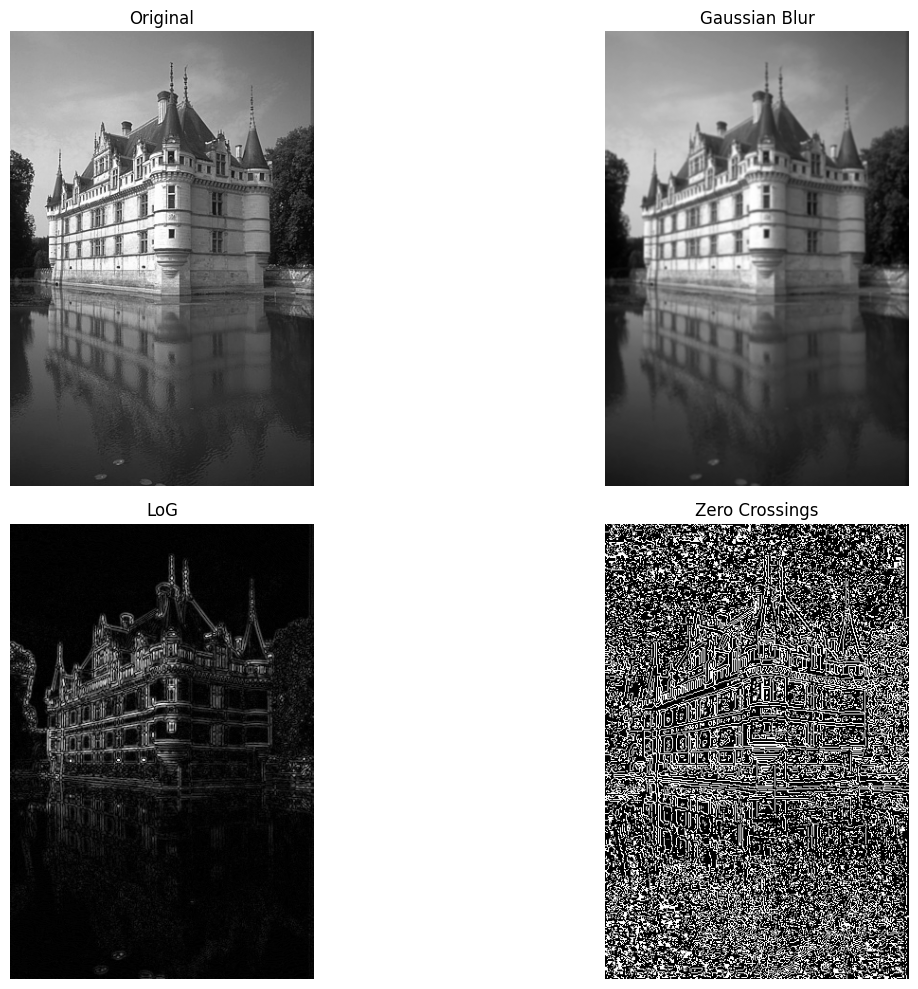

In [9]:
def zero_crossing_detection(log_image, threshold=0):
    """
    Detect zero crossings in LoG filtered image
    """
    # Check for sign changes in horizontal and vertical directions
    zero_cross = np.zeros_like(log_image, dtype=np.uint8)
    
    # Horizontal zero crossings
    for i in range(1, log_image.shape[0]):
        for j in range(log_image.shape[1]):
            if log_image[i, j] * log_image[i-1, j] < 0:
                if abs(log_image[i, j] - log_image[i-1, j]) > threshold:
                    zero_cross[i, j] = 255
    
    # Vertical zero crossings
    for i in range(log_image.shape[0]):
        for j in range(1, log_image.shape[1]):
            if log_image[i, j] * log_image[i, j-1] < 0:
                if abs(log_image[i, j] - log_image[i, j-1]) > threshold:
                    zero_cross[i, j] = 255
    
    return zero_cross

# Complete pipeline
blurred = cv2.GaussianBlur(image, (5, 5), 1.0)
log_result = cv2.Laplacian(blurred, cv2.CV_64F, ksize=3)
zero_cross = zero_crossing_detection(log_result, threshold=5)

display_images(
    [image, blurred, cv2.convertScaleAbs(log_result), zero_cross],
    ['Original', 'Gaussian Blur', 'LoG', 'Zero Crossings'],
    rows=2, cols=2
)

## 8. Hough Transform

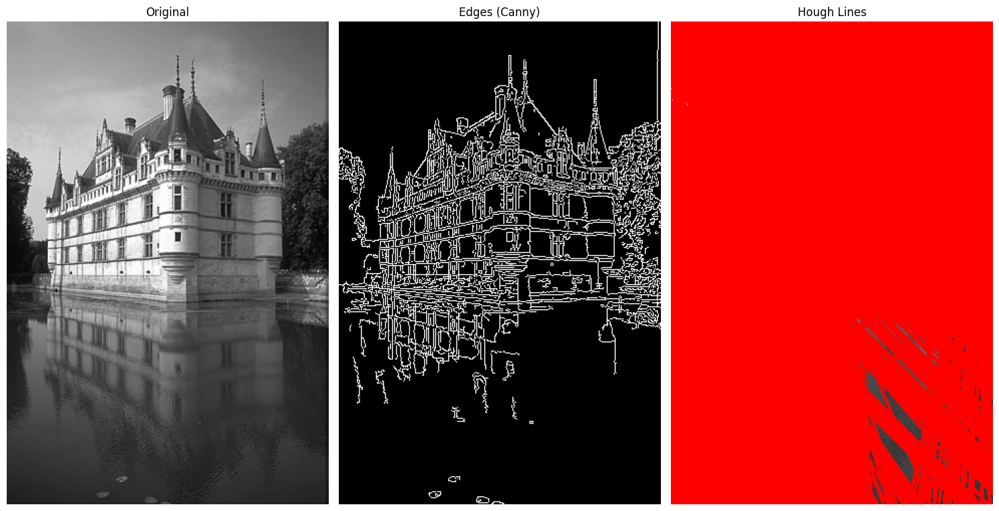

In [10]:
def hough_line_detection(image, threshold=100):
    """
    Detect lines using Hough transform
    """
    # Detect edges first
    edges = cv2.Canny(image, 50, 150, apertureSize=3)

    # Standard Hough Line Transform
    lines = cv2.HoughLines(edges, rho=1, theta=np.pi/180, threshold=threshold)

    # Draw lines
    line_image = cv2.cvtColor(image.copy(), cv2.COLOR_GRAY2BGR)
    if lines is not None:
        for rho, theta in lines[:, 0]:
            a = np.cos(theta)
            b = np.sin(theta)
            x0 = a * rho
            y0 = b * rho
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            cv2.line(line_image, (x1, y1), (x2, y2), (0, 0, 255), 2)

    return edges, line_image

# Apply Hough line detection
edges, hough_lines = hough_line_detection(image, threshold=80)

display_images(
    [image, edges, hough_lines],
    ['Original', 'Edges (Canny)', 'Hough Lines'],
    rows=1, cols=3
)

## 9. Threshold Segmentation

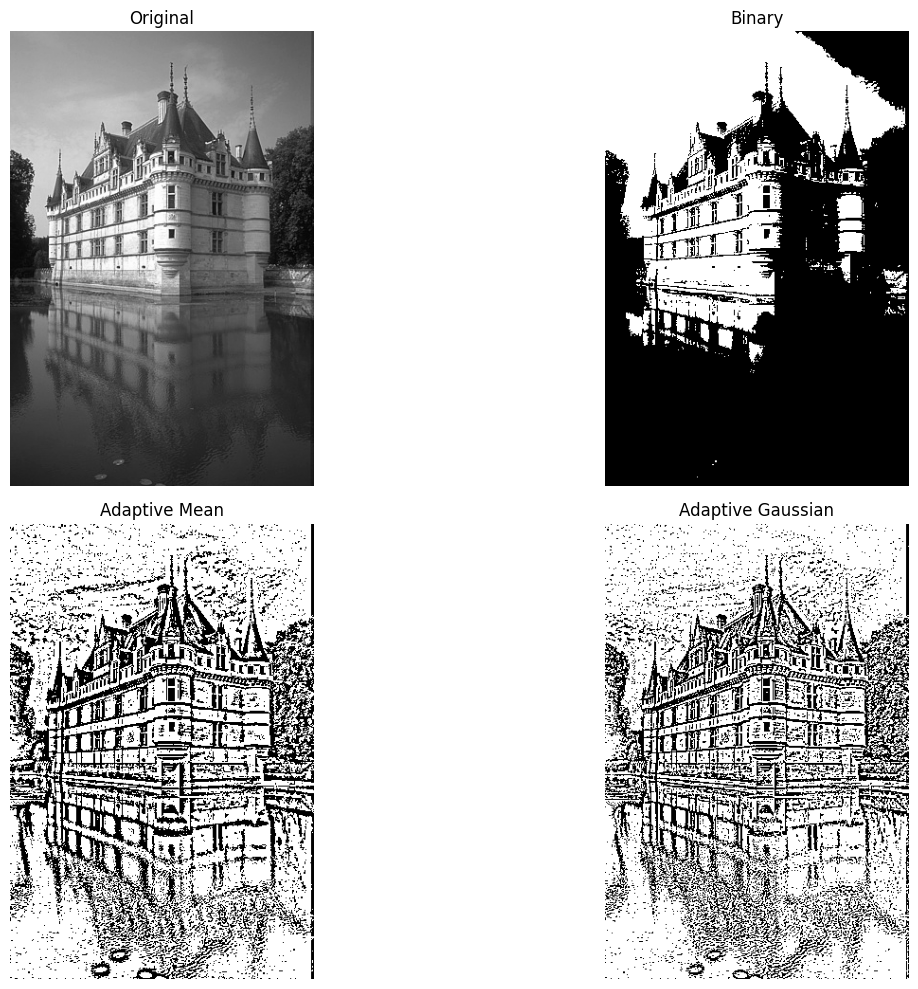

In [11]:
def threshold_segmentation(image):
    """
    Apply various thresholding techniques
    """
    # Simple binary thresholding
    ret, binary = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    
    # Adaptive mean thresholding
    adaptive_mean = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                         cv2.THRESH_BINARY, blockSize=11, C=2)
    
    # Adaptive Gaussian thresholding
    adaptive_gaussian = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                             cv2.THRESH_BINARY, blockSize=11, C=2)
    
    return binary, adaptive_mean, adaptive_gaussian

# Apply thresholding
binary, adaptive_mean, adaptive_gaussian = threshold_segmentation(image)

display_images(
    [image, binary, adaptive_mean, adaptive_gaussian],
    ['Original', 'Binary', 'Adaptive Mean', 'Adaptive Gaussian'],
    rows=2, cols=2
)

## 9.1. Morphological Operations on Threshold Results

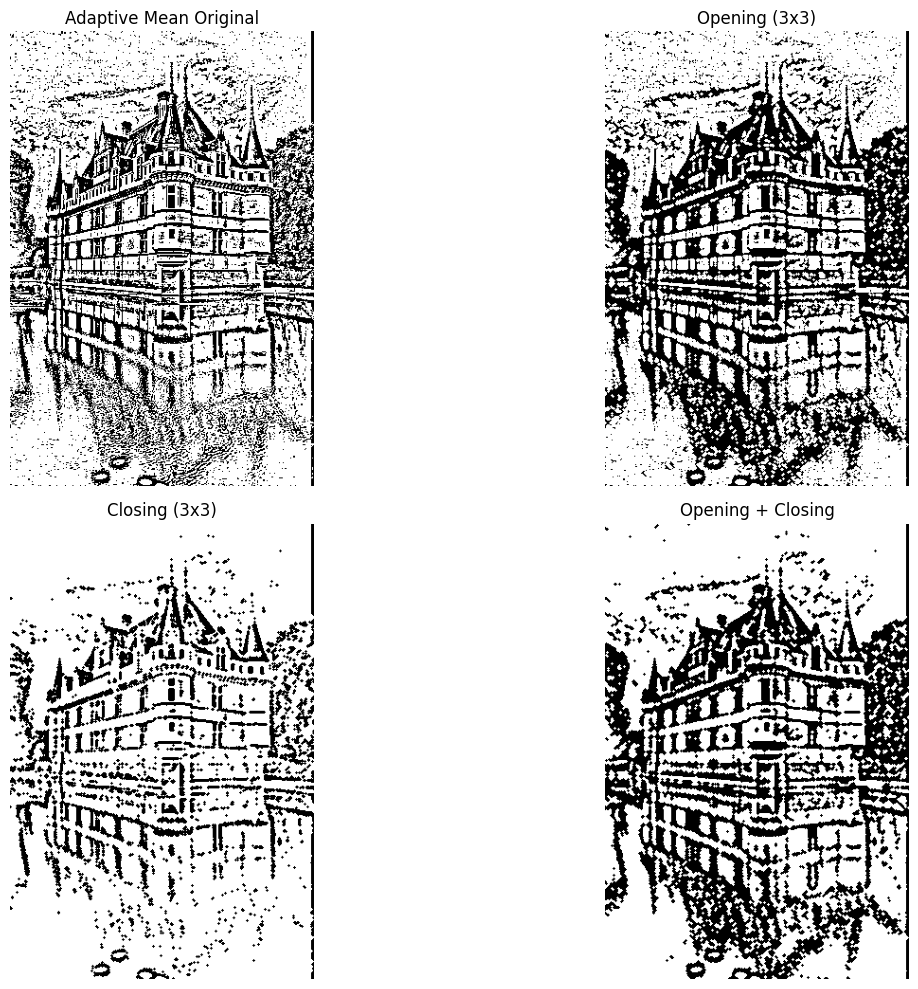

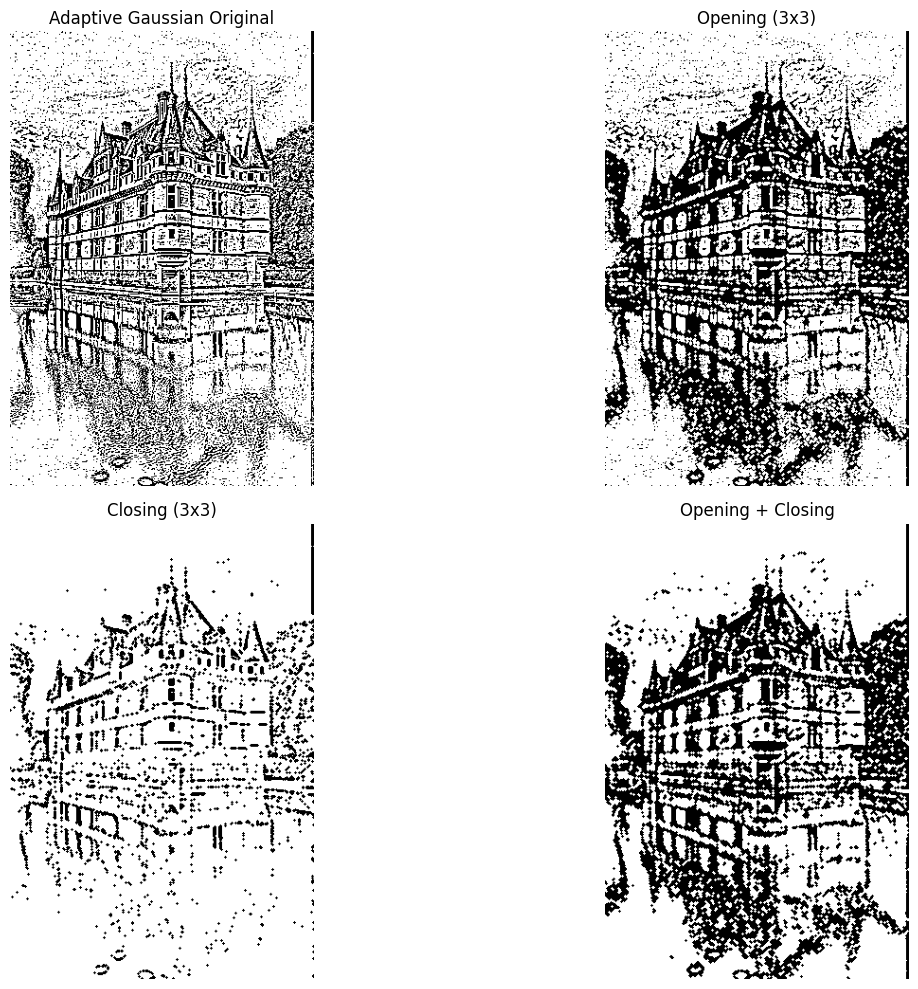

In [12]:
def apply_morphology(image, operation='opening', kernel_size=5):
    """
    Apply morphological operations to clean up binary images
    
    Parameters:
    - image: Binary image
    - operation: 'erosion', 'dilation', 'opening', 'closing'
    - kernel_size: Size of the structuring element
    """
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    
    if operation == 'erosion':
        result = cv2.erode(image, kernel, iterations=1)
    elif operation == 'dilation':
        result = cv2.dilate(image, kernel, iterations=1)
    elif operation == 'opening':
        # Erosion followed by dilation - removes small noise
        result = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
    elif operation == 'closing':
        # Dilation followed by erosion - fills small holes
        result = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    else:
        result = image
    
    return result

# Apply morphological operations to adaptive mean
adaptive_mean_opening = apply_morphology(adaptive_mean, 'opening', 3)
adaptive_mean_closing = apply_morphology(adaptive_mean, 'closing', 3)
# Combine opening + closing for better noise removal
adaptive_mean_open_close = apply_morphology(adaptive_mean_opening, 'closing', 3)

# Display adaptive mean with morphology
display_images(
    [adaptive_mean, adaptive_mean_opening, adaptive_mean_closing, adaptive_mean_open_close],
    ['Adaptive Mean Original', 'Opening (3x3)', 'Closing (3x3)', 'Opening + Closing'],
    rows=2, cols=2
)

# Apply morphological operations to adaptive gaussian
adaptive_gaussian_opening = apply_morphology(adaptive_gaussian, 'opening', 3)
adaptive_gaussian_closing = apply_morphology(adaptive_gaussian, 'closing', 3)
# Combine opening + closing for better noise removal
adaptive_gaussian_open_close = apply_morphology(adaptive_gaussian_opening, 'closing', 3)

# Display adaptive gaussian with morphology
display_images(
    [adaptive_gaussian, adaptive_gaussian_opening, adaptive_gaussian_closing, adaptive_gaussian_open_close],
    ['Adaptive Gaussian Original', 'Opening (3x3)', 'Closing (3x3)', 'Opening + Closing'],
    rows=2, cols=2
)

## 10. K-Means Clustering Segmentation

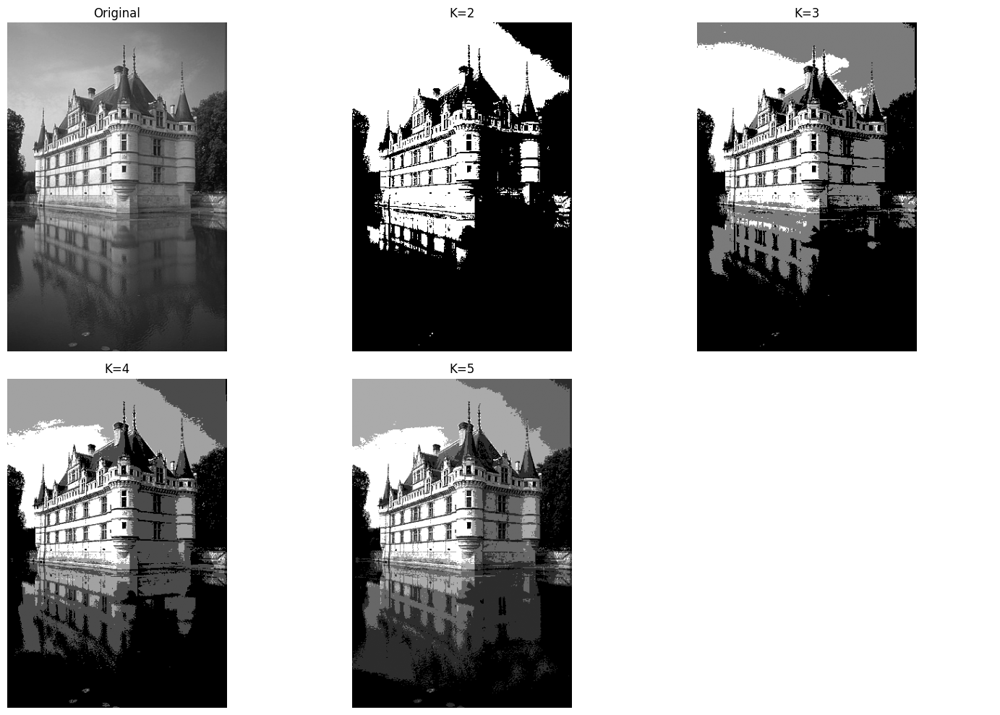

In [13]:
def kmeans_segmentation(image, k=3):
    """
    Segment image using K-means clustering
    """
    # Reshape image to pixel vectors
    pixel_values = image.reshape((-1, 1))
    pixel_values = np.float32(pixel_values)
    
    # Define criteria for K-means
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    
    # Apply K-means
    compactness, labels, centers = cv2.kmeans(pixel_values, k, None,
                                             criteria, 10,
                                             cv2.KMEANS_RANDOM_CENTERS)
    
    # Convert centers to uint8
    centers = np.uint8(centers)
    
    # Map labels to center colors
    segmented_image = centers[labels.flatten()]
    segmented_image = segmented_image.reshape(image.shape)
    
    return segmented_image, labels, centers, compactness

# Apply K-means with different K values
kmeans_2, labels_2, centers_2, comp_2 = kmeans_segmentation(image, k=2)
kmeans_3, labels_3, centers_3, comp_3 = kmeans_segmentation(image, k=3)
kmeans_4, labels_4, centers_4, comp_4 = kmeans_segmentation(image, k=4)
kmeans_5, labels_5, centers_5, comp_5 = kmeans_segmentation(image, k=5)

display_images(
    [image, kmeans_2, kmeans_3, kmeans_4, kmeans_5],
    ['Original', 'K=2', 'K=3', 'K=4', 'K=5'],
    rows=2, cols=3
)

## 11. Texture Segmentation

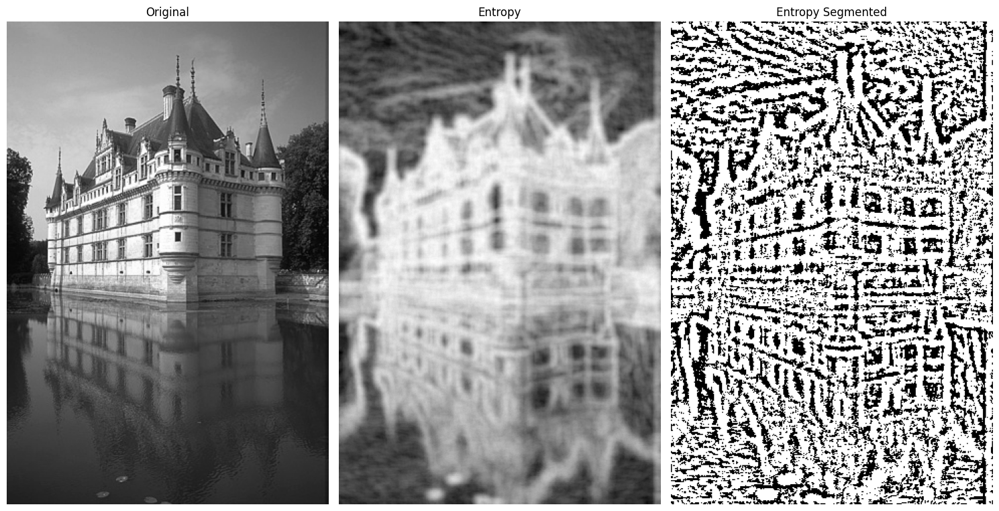

In [14]:
def texture_segmentation_entropy(image):
    """
    Texture segmentation using local entropy
    """
    # Calculate local entropy for texture quantification
    entropy_img = entropy(image, disk(5))
    
    # Normalize entropy
    entropy_normalized = np.uint8(255 * entropy_img / entropy_img.max())
    
    # Apply Adaptive Gaussian thresholding on entropy image
    segmented = cv2.adaptiveThreshold(entropy_normalized, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY, blockSize=11, C=2)
    
    return entropy_normalized, segmented

# Apply texture segmentation
entropy_img, entropy_segmented = texture_segmentation_entropy(image)

display_images(
    [image, entropy_img, entropy_segmented],
    ['Original', 'Entropy', 'Entropy Segmented'],
    rows=1, cols=3
)

## 12. Region-Based Segmentation

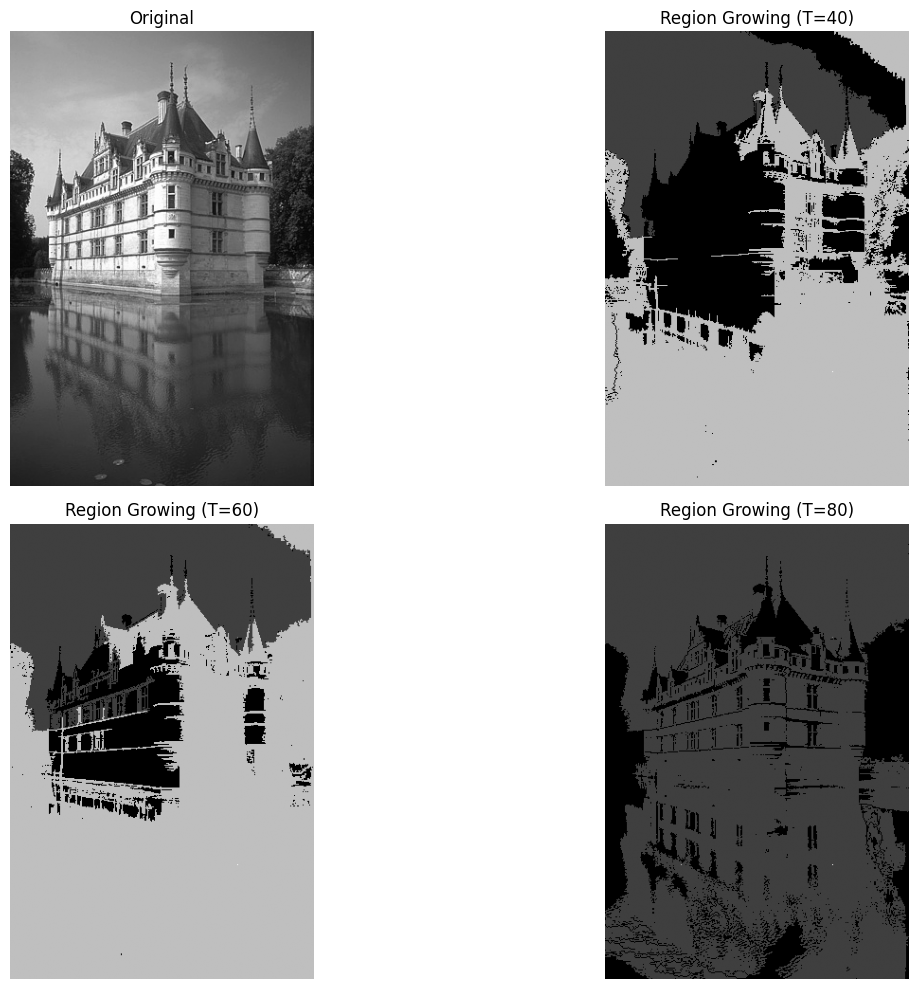

Region Growing Applied:
  - Number of seed points: 4
  - Thresholds tested: 40, 60, 80


In [15]:
def region_growing(image, seeds, threshold=10):
    """
    Region growing segmentation
    
    Parameters:
    - image: Input grayscale image
    - seeds: List of (y, x) seed coordinates
    - threshold: Intensity difference threshold for region membership
    """
    h, w = image.shape
    segmented = np.zeros_like(image, dtype=np.int32)
    
    for region_label, seed in enumerate(seeds, start=1):
        # Initialize region with seed
        seed_y, seed_x = seed
        region_mean = float(image[seed_y, seed_x])
        
        # Queue for pixels to check
        to_check = [seed]
        visited = set()
        visited.add(seed)
        
        while to_check:
            y, x = to_check.pop(0)
            
            # Check if pixel belongs to region
            if abs(float(image[y, x]) - region_mean) <= threshold:
                segmented[y, x] = region_label
                
                # Update region mean
                region_pixels = segmented == region_label
                region_mean = np.mean(image[region_pixels])
                
                # Add neighbors to queue
                for dy, dx in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                    ny, nx = y + dy, x + dx
                    if (0 <= ny < h and 0 <= nx < w and 
                        (ny, nx) not in visited and segmented[ny, nx] == 0):
                        to_check.append((ny, nx))
                        visited.add((ny, nx))
    
    return segmented


# use different intensity regions (4 seed points)
h, w = image.shape
seeds = [
    (h // 4, w // 4),      # Top-left region
    (h // 4, 3 * w // 4),  # Top-right region
    (3 * h // 4, w // 4),  # Bottom-left region
    (3 * h // 4, 3 * w // 4)  # Bottom-right region
]

# Apply region growing with different thresholds
region_grown_1 = region_growing(image, seeds, threshold=40)
region_grown_2 = region_growing(image, seeds, threshold=60)
region_grown_3 = region_growing(image, seeds, threshold=80)

# Normalize for visualization
rg1_vis = np.uint8(255 * region_grown_1 / region_grown_1.max()) if region_grown_1.max() > 0 else region_grown_1
rg2_vis = np.uint8(255 * region_grown_2 / region_grown_2.max()) if region_grown_2.max() > 0 else region_grown_2
rg3_vis = np.uint8(255 * region_grown_3 / region_grown_3.max()) if region_grown_3.max() > 0 else region_grown_3

display_images(
    [image, rg1_vis, rg2_vis, rg3_vis],
    ['Original', 'Region Growing (T=40)', 'Region Growing (T=60)', 'Region Growing (T=80)'],
    rows=2, cols=2
)

print("Region Growing Applied:")
print(f"  - Number of seed points: {len(seeds)}")
print(f"  - Thresholds tested: 40, 60, 80")

## 13. Split and Merge Segmentation

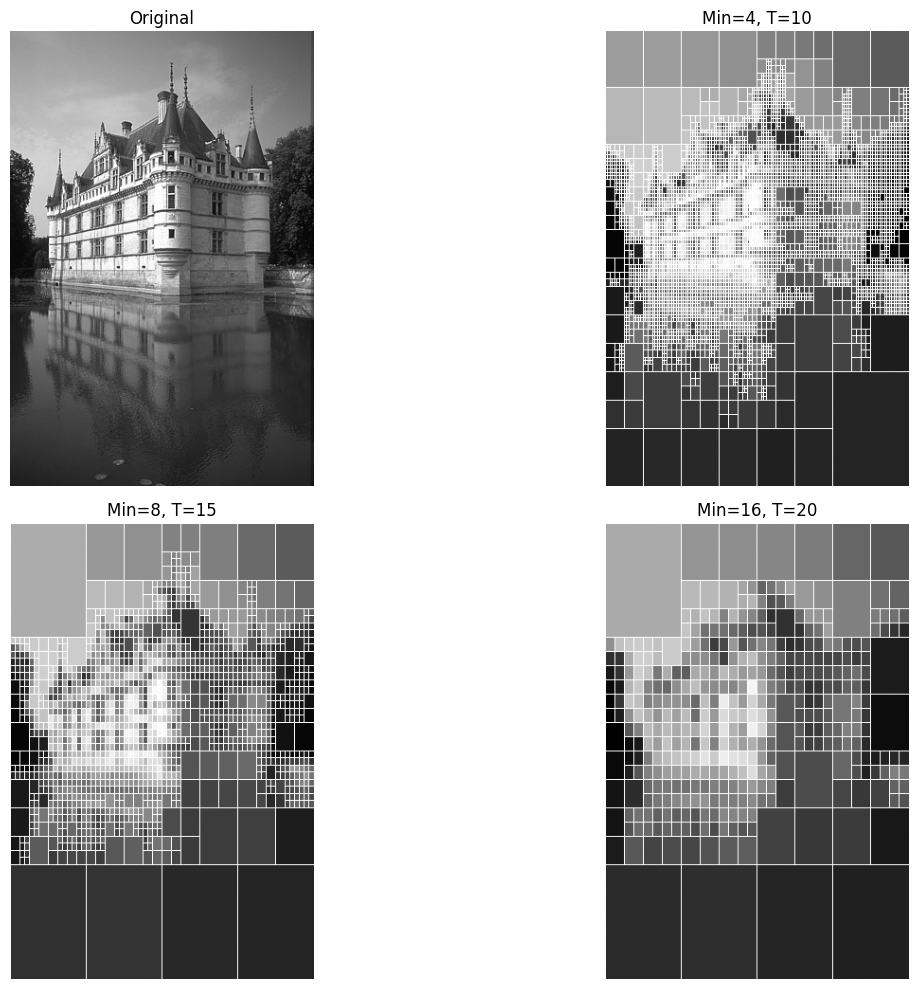

In [17]:
class QuadTreeNode:
    def __init__(self, x, y, width, height, image):
        self.x = x
        self.y = y
        self.width = width
        self.height = height
        self.region = image[y:y+height, x:x+width]
        self.mean = np.mean(self.region)
        self.std = np.std(self.region)
        self.children = []
        self.is_leaf = True

def is_homogeneous(node, threshold=10):
    """
    Check if region variance is below threshold
    """
    return node.std < threshold

def split_node(node, image, min_size, threshold):
    """
    Recursively split non-homogeneous regions
    """
    if node.width <= min_size or node.height <= min_size:
        return
    
    if is_homogeneous(node, threshold):
        return
    
    # Split into 4 quadrants
    node.is_leaf = False
    half_width = node.width // 2
    half_height = node.height // 2
    
    # Create child nodes
    children_coords = [
        (node.x, node.y, half_width, half_height),  # Top-left
        (node.x + half_width, node.y, node.width - half_width, half_height),  # Top-right
        (node.x, node.y + half_height, half_width, node.height - half_height),  # Bottom-left
        (node.x + half_width, node.y + half_height, 
         node.width - half_width, node.height - half_height)  # Bottom-right
    ]
    
    for x, y, w, h in children_coords:
        child = QuadTreeNode(x, y, w, h, image)
        node.children.append(child)
        split_node(child, image, min_size, threshold)

def draw_segments(node, output_image):
    """
    Draw segmented regions
    """
    if node.is_leaf:
        # Fill region with mean value
        output_image[node.y:node.y+node.height, node.x:node.x+node.width] = node.mean
        # Draw border
        cv2.rectangle(output_image, (node.x, node.y), 
                     (node.x + node.width, node.y + node.height), 255, 1)
    else:
        for child in node.children:
            draw_segments(child, output_image)

def split_and_merge_segmentation(image, min_size=8, threshold=15):
    """
    Split and merge segmentation using quadtree
    """
    # Create root node
    root = QuadTreeNode(0, 0, image.shape[1], image.shape[0], image)
    
    # Split recursively
    split_node(root, image, min_size, threshold)
    
    # Draw segmented image
    output = np.zeros_like(image)
    draw_segments(root, output)
    
    return output, root

# Apply split and merge with different parameters
split_merge_1, root_1 = split_and_merge_segmentation(image, min_size=4, threshold=10)
split_merge_2, root_2 = split_and_merge_segmentation(image, min_size=8, threshold=15)
split_merge_3, root_3 = split_and_merge_segmentation(image, min_size=16, threshold=20)

display_images(
    [image, split_merge_1, split_merge_2, split_merge_3],
    ['Original', 'Min=4, T=10', 'Min=8, T=15', 'Min=16, T=20'],
    rows=2, cols=2
)

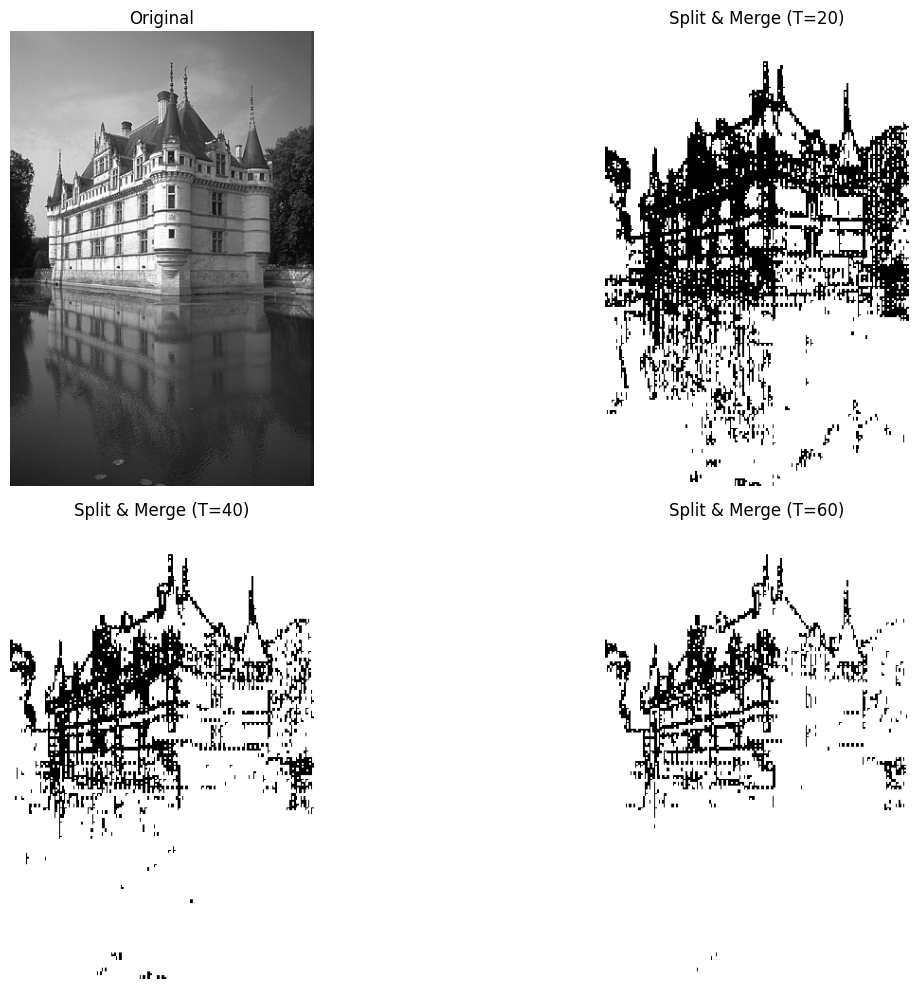

In [19]:
def is_homogeneous_alt(region, threshold):
    """Check if the region is homogeneous based on the intensity threshold."""
    if region.size == 0:
        return True
    min_val, max_val = np.min(region), np.max(region)
    return (max_val - min_val) <= threshold

def split_and_merge_alt(image, threshold):
    """Segment the image by recursively splitting and merging regions."""
    
    def recursive_split(region):
        rows, cols = region.shape
        if rows <= 1 or cols <= 1:
            return np.zeros_like(region, dtype=np.uint8)
        
        if is_homogeneous_alt(region, threshold):
            return np.ones_like(region, dtype=np.uint8)
        
        # Split the region into four quadrants
        mid_row, mid_col = rows // 2, cols // 2
        
        # Ensure quadrants are correctly sized
        top_left = region[:mid_row, :mid_col]
        top_right = region[:mid_row, mid_col:]
        bottom_left = region[mid_row:, :mid_col]
        bottom_right = region[mid_row:, mid_col:]
        
        # Create empty segmented image of the same size
        segmented_quadrants = np.zeros_like(region, dtype=np.uint8)
        
        # Recursive splitting and assignment to segmented_quadrants
        segmented_quadrants[:mid_row, :mid_col] = recursive_split(top_left)
        segmented_quadrants[:mid_row, mid_col:] = recursive_split(top_right)
        segmented_quadrants[mid_row:, :mid_col] = recursive_split(bottom_left)
        segmented_quadrants[mid_row:, mid_col:] = recursive_split(bottom_right)
        
        return segmented_quadrants

    def merge_regions(segmented):
        """Merge adjacent regions if they are similar."""
        # Placeholder function for merging adjacent regions if needed
        return segmented

    # Ensure the image is grayscale
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply the region splitting and merging algorithm
    segmented_image = recursive_split(image)
    segmented_image = merge_regions(segmented_image)
    
    return segmented_image

# Apply the alternative split and merge
# Using different thresholds to see the effect
sm_alt_1 = split_and_merge_alt(image, threshold=20)
sm_alt_2 = split_and_merge_alt(image, threshold=40)
sm_alt_3 = split_and_merge_alt(image, threshold=60)

display_images(
    [image, sm_alt_1 * 255, sm_alt_2 * 255, sm_alt_3 * 255],
    ['Original', 'Split & Merge (T=20)', 'Split & Merge (T=40)', 'Split & Merge (T=60)'],
    rows=2, cols=2
)